In [4]:
!pip install geopandas
!pip install contextily

     |████████████████████████████████| 1.0 MB 8.7 MB/s 
     |████████████████████████████████| 15.4 MB 37.6 MB/s 
     |████████████████████████████████| 6.3 MB 33.6 MB/s 
     |████████████████████████████████| 19.3 MB 89 kB/s 


In [5]:
import geopandas
import pandas as pd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import contextily

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. l'elenco dei comuni che hanno un'area inferiore ai 10 kmq: visualizzare il numero, l'elenco e la mappa  con tutti i comuni colorati in verde (trasparente) e bordati di nero

In [7]:
comuni = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/Com01012021_g")
comuni

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
0,1,1,1,201,201,1001,001001,AgliÃ¨,None,0,16097.848297,1.330696e+07,"POLYGON ((404703.558 5026682.655, 405359.554 5..."
1,1,1,1,201,201,1002,001002,Airasca,None,0,16684.218599,1.595353e+07,"POLYGON ((380700.909 4977305.520, 381105.998 4..."
2,1,1,1,201,201,1003,001003,Ala di Stura,None,0,29892.674582,4.575189e+07,"POLYGON ((364710.857 5022090.678, 364737.794 5..."
3,1,1,1,201,201,1004,001004,Albiano d'Ivrea,None,0,16192.656480,1.103356e+07,"POLYGON ((415942.504 5033304.609, 416079.315 5..."
4,1,1,1,201,201,1006,001006,Almese,None,0,16077.245089,1.771710e+07,"POLYGON ((376934.962 4999073.854, 376960.555 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,5,20,111,0,111,111103,111103,Villaputzu,None,0,100515.537851,1.807260e+08,"MULTIPOLYGON (((556602.772 4375162.650, 556598..."
7899,5,20,111,0,111,111104,111104,Villasalto,None,0,58635.095264,1.303933e+08,"POLYGON ((541186.146 4375105.653, 541180.146 4..."
7900,5,20,111,0,111,111105,111105,Villasimius,None,0,49735.818257,5.759282e+07,"MULTIPOLYGON (((546451.098 4325900.553, 546443..."
7901,5,20,111,0,111,111106,111106,Villasor,None,0,53375.684321,8.640693e+07,"POLYGON ((500362.475 4361229.767, 500397.474 4..."


In [8]:
regioni = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/Reg01012021_g")
regioni

,COD_RIP,COD_REG,DEN_REG,Shape_Leng,Shape_Area,geometry
0,1,1,Piemonte,1.235512e+06,2.539390e+10,"POLYGON ((457749.464 5145501.795, 458662.395 5..."
1,1,2,Valle d'Aosta,3.109681e+05,3.258838e+09,"POLYGON ((390652.644 5091766.171, 390748.643 5..."
2,1,3,Lombardia,1.410223e+06,2.386232e+10,"MULTIPOLYGON (((485536.366 4985444.605, 485366..."
3,2,4,Trentino-Alto Adige,8.008937e+05,1.360755e+10,"POLYGON ((743267.749 5219765.793, 743387.812 5..."
4,2,5,Veneto,1.054587e+06,1.834355e+10,"POLYGON ((768123.960 5175397.497, 768135.210 5..."
5,2,6,Friuli Venezia Giulia,6.700448e+05,7.933911e+09,"MULTIPOLYGON (((872344.457 5061894.048, 872344..."
6,1,7,Liguria,8.205420e+05,5.414612e+09,"MULTIPOLYGON (((568226.691 4874823.573, 568219..."
7,2,8,Emilia-Romagna,1.176188e+06,2.244275e+10,"MULTIPOLYGON (((618343.929 4893985.661, 618335..."
8,3,9,Toscana,1.306596e+06,2.298352e+10,"MULTIPOLYGON (((674426.642 4680710.364, 674563..."
9,3,10,Umbria,6.197684e+05,8.464380e+09,"MULTIPOLYGON (((776982.140 4832209.918, 776910..."


In [9]:
Lombardia = regioni[regioni["DEN_REG"] == "Lombardia"]
Lombardia

,COD_RIP,COD_REG,DEN_REG,Shape_Leng,Shape_Area,geometry
2,1,3,Lombardia,1.410223e+06,2.386232e+10,"MULTIPOLYGON (((485536.366 4985444.605, 485366..."


In [15]:
comuni_lombardia = comuni[comuni.within(Lombardia.geometry.squeeze())]
comuni_lombardia

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,Shape_Area_KM
1448,1,3,12,0,12,12001,012001,Agra,None,0,6996.108320,2.942389e+06,"POLYGON ((482802.662 5097733.142, 482784.662 5...",2.942389
1449,1,3,12,0,12,12002,012002,Albizzate,None,0,9255.748026,3.813831e+06,"POLYGON ((485235.221 5064709.066, 485545.361 5...",3.813831
1450,1,3,12,0,12,12003,012003,Angera,None,0,24194.847570,1.748219e+07,"POLYGON ((470218.756 5071198.335, 470937.656 5...",17.482186
1451,1,3,12,0,12,12004,012004,Arcisate,None,0,19072.979574,1.229388e+07,"POLYGON ((488207.686 5080963.765, 488368.654 5...",12.293875
1452,1,3,12,0,12,12005,012005,Arsago Seprio,None,0,15318.402658,1.053346e+07,"POLYGON ((478637.631 5063107.396, 478750.600 5...",10.533465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7741,1,3,108,0,108,108051,108051,Busnago,None,0,11376.029586,5.834750e+06,"POLYGON ((535742.586 5052473.474, 535839.585 5...",5.834750
7742,1,3,108,0,108,108052,108052,Caponago,None,0,11874.711735,4.807794e+06,"POLYGON ((530927.622 5047008.514, 530890.358 5...",4.807794
7743,1,3,108,0,108,108053,108053,Cornate d'Adda,None,0,15414.910444,1.364665e+07,"POLYGON ((537678.573 5057235.438, 537951.570 5...",13.646650
7744,1,3,108,0,108,108054,108054,Lentate sul Seveso,None,0,17060.616570,1.431746e+07,"POLYGON ((508523.788 5059797.421, 509626.779 5...",14.317455


In [16]:
comuni["Shape_Area_KM"] = comuni["Shape_Area"] / 1000000 
comuni

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,Shape_Area_KM
0,1,1,1,201,201,1001,001001,AgliÃ¨,None,0,16097.848297,1.330696e+07,"POLYGON ((404703.558 5026682.655, 405359.554 5...",13.306962
1,1,1,1,201,201,1002,001002,Airasca,None,0,16684.218599,1.595353e+07,"POLYGON ((380700.909 4977305.520, 381105.998 4...",15.953529
2,1,1,1,201,201,1003,001003,Ala di Stura,None,0,29892.674582,4.575189e+07,"POLYGON ((364710.857 5022090.678, 364737.794 5...",45.751888
3,1,1,1,201,201,1004,001004,Albiano d'Ivrea,None,0,16192.656480,1.103356e+07,"POLYGON ((415942.504 5033304.609, 416079.315 5...",11.033555
4,1,1,1,201,201,1006,001006,Almese,None,0,16077.245089,1.771710e+07,"POLYGON ((376934.962 4999073.854, 376960.555 4...",17.717104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,5,20,111,0,111,111103,111103,Villaputzu,None,0,100515.537851,1.807260e+08,"MULTIPOLYGON (((556602.772 4375162.650, 556598...",180.725984
7899,5,20,111,0,111,111104,111104,Villasalto,None,0,58635.095264,1.303933e+08,"POLYGON ((541186.146 4375105.653, 541180.146 4...",130.393340
7900,5,20,111,0,111,111105,111105,Villasimius,None,0,49735.818257,5.759282e+07,"MULTIPOLYGON (((546451.098 4325900.553, 546443...",57.592818
7901,5,20,111,0,111,111106,111106,Villasor,None,0,53375.684321,8.640693e+07,"POLYGON ((500362.475 4361229.767, 500397.474 4...",86.406930


In [20]:
comuni_min = comuni_lombardia[comuni_lombardia["Shape_Area_KM"] < 10]
comuni_min

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,Shape_Area_KM
1448,1,3,12,0,12,12001,012001,Agra,None,0,6996.108320,2.942389e+06,"POLYGON ((482802.662 5097733.142, 482784.662 5...",2.942389
1449,1,3,12,0,12,12002,012002,Albizzate,None,0,9255.748026,3.813831e+06,"POLYGON ((485235.221 5064709.066, 485545.361 5...",3.813831
1453,1,3,12,0,12,12006,012006,Azzate,None,0,11761.330818,4.536471e+06,"POLYGON ((483900.127 5071449.880, 484020.211 5...",4.536471
1454,1,3,12,0,12,12007,012007,Azzio,None,0,7602.953671,2.172798e+06,"POLYGON ((477914.331 5082436.678, 477696.259 5...",2.172798
1455,1,3,12,0,12,12008,012008,Barasso,None,0,10877.705348,3.872669e+06,"POLYGON ((481124.582 5079579.276, 481862.732 5...",3.872669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7738,1,3,108,0,108,108048,108048,Verano Brianza,None,0,9171.724083,3.667862e+06,"POLYGON ((517613.394 5060787.396, 518293.122 5...",3.667862
7739,1,3,108,0,108,108049,108049,Villasanta,None,0,9629.121636,4.645122e+06,"POLYGON ((523356.646 5052024.704, 523490.961 5...",4.645122
7741,1,3,108,0,108,108051,108051,Busnago,None,0,11376.029586,5.834750e+06,"POLYGON ((535742.586 5052473.474, 535839.585 5...",5.834750
7742,1,3,108,0,108,108052,108052,Caponago,None,0,11874.711735,4.807794e+06,"POLYGON ((530927.622 5047008.514, 530890.358 5...",4.807794


Il comuni sono:  709


1448              Agra
1449         Albizzate
1453            Azzate
1454             Azzio
1455           Barasso
             ...      
7738    Verano Brianza
7739        Villasanta
7741           Busnago
7742          Caponago
7745          Roncello
Name: COMUNE, Length: 709, dtype: object

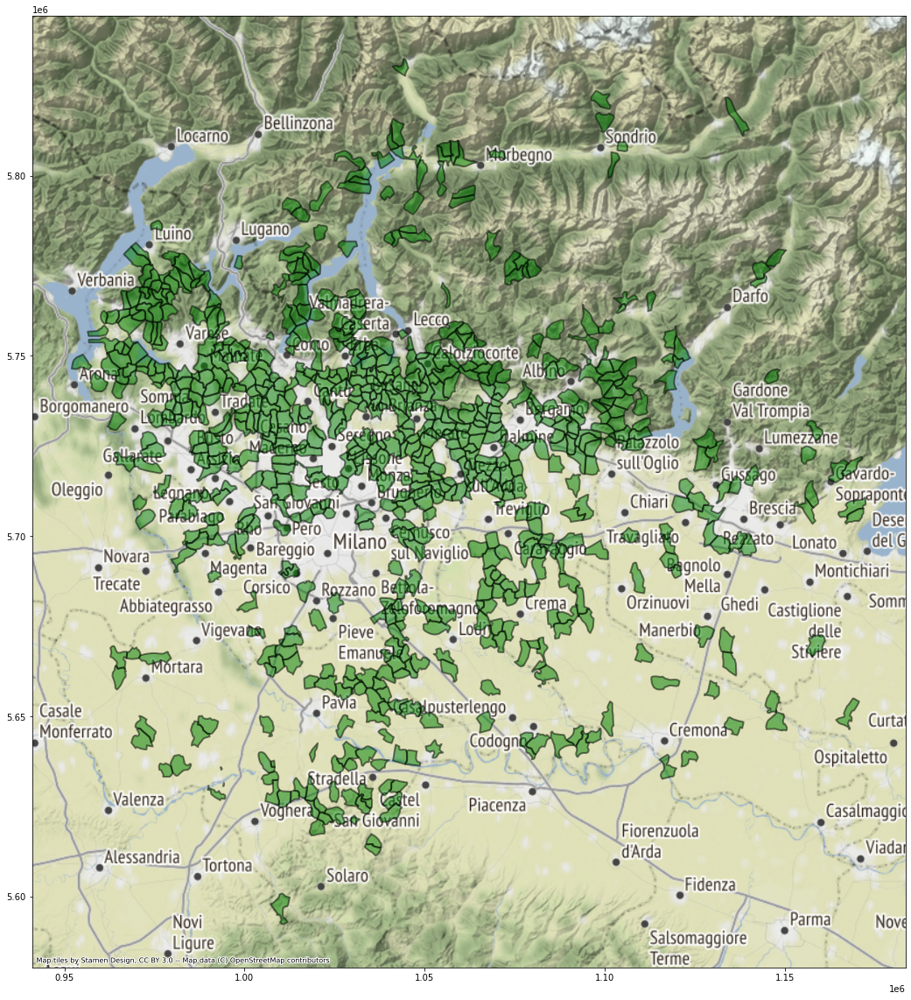

In [21]:
ax = comuni_min.to_crs(epsg = 3857).plot(facecolor = "green", edgecolor = "black", linewidth= 2, alpha = 0.5, figsize = (20,20))
contextily.add_basemap(ax)

print("Il comuni sono: ", comuni_min.shape[0]) #stampo l elenco dei comuni

comuni_min["COMUNE"]

2. l'elenco dei comuni che hanno un'area inferiore ai 10 kmq e che si trovano all'interno di un parco: visualizzare il numero, l'elenco e la mappa  con tutti i comuni colorati in verde (trasparente) e bordati di nero. Visualizzare anche i parchi

In [23]:
parchi = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/geopandas-tutorial-master/data/Parchi_regionali_e_nazionali_polygon.zip")
parchi

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
0,5,Parco Alpi Orobie Valtellinesi,18,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,18:Parco Alpi Orobie Valtellinesi,"POLYGON ((587577.037 5107497.548, 587615.036 5..."
1,6,Parco Alpi Orobie Bergamasche,17,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,17:Parco Alpi Orobie Bergamasche,"POLYGON ((586196.195 5100871.221, 586351.566 5..."
2,7,Parco Campo dei Fiori,9,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,9: Parco Campo dei Fiori,"POLYGON ((486537.216 5078441.081, 486530.341 5..."
3,8,Parco Alto Garda Bresciano,7,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,7: Parco Alto Garda Bresciano,"POLYGON ((617860.123 5053114.432, 617863.431 5..."
4,1,National Park (CH),99,0,Non valutato,1,Parco Nazionale,3,Area extranazionale,99:National Park (CH),"POLYGON ((584084.298 5161019.100, 583763.056 5..."
5,2,Parco Nazionale dello Stelvio (TN-BZ),97,0,Non valutato,1,Parco Nazionale,2,Area extraregionale,97:Parco Nazionale dello Stelvio (TN-BZ),"POLYGON ((611429.112 5154022.734, 612080.475 5..."
6,3,Parco Nazionale dello Stelvio,98,0,Non valutato,1,Parco Nazionale,1,Area Regionale,98:Parco Nazionale dello Stelvio,"POLYGON ((584084.298 5161019.100, 584083.048 5..."
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."
8,9,Parco Adda Nord,5,45,Parco fluviale e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,5: Parco Adda Nord,"POLYGON ((533258.682 5067541.607, 533248.433 5..."
9,15,Parco Valle del Ticino,1,1245,"Parco agricolo,forestale,fluviale e di cintura...",2,Parco Regionale,1,Area Regionale,1: Parco Valle del Ticino,"POLYGON ((476666.268 5067282.167, 476899.067 5..."


In [24]:
comuniParchi = comuni_min[comuni_min.within(parchi.geometry.squeeze().unary_union)]
comuniParchi

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,Shape_Area_KM
1468,1,3,12,0,12,12021,012021,Brinzio,None,0,11411.097228,6.331554e+06,"POLYGON ((485212.146 5082260.257, 485813.047 5...",6.331554
1478,1,3,12,0,12,12032,012032,Cardano al Campo,None,0,13167.344776,9.719170e+06,"POLYGON ((482139.874 5056008.899, 482510.114 5...",9.719170
1485,1,3,12,0,12,12039,012039,Casorate Sempione,None,0,10833.342473,6.904374e+06,"POLYGON ((479910.698 5058376.220, 480839.388 5...",6.904374
1514,1,3,12,0,12,12068,012068,Ferno,None,0,14509.069937,8.881223e+06,"POLYGON ((478697.847 5053371.432, 478784.656 5...",8.881223
1624,1,3,13,0,13,13059,013059,Castelnuovo Bozzente,None,0,8014.926758,3.769634e+06,"POLYGON ((496062.659 5068749.356, 496323.628 5...",3.769634
1841,1,3,15,215,215,15061,015061,Cassinetta di Lugagnano,None,0,8392.126482,3.624219e+06,"POLYGON ((493127.901 5031226.632, 493816.897 5...",3.624219
7478,1,3,98,0,98,98033,098033,Maccastorna,None,0,10177.115803,5.360894e+06,"POLYGON ((567384.343 5000275.858, 567572.342 5...",5.360894


Il comuni sono:  709


1448              Agra
1449         Albizzate
1453            Azzate
1454             Azzio
1455           Barasso
             ...      
7738    Verano Brianza
7739        Villasanta
7741           Busnago
7742          Caponago
7745          Roncello
Name: COMUNE, Length: 709, dtype: object

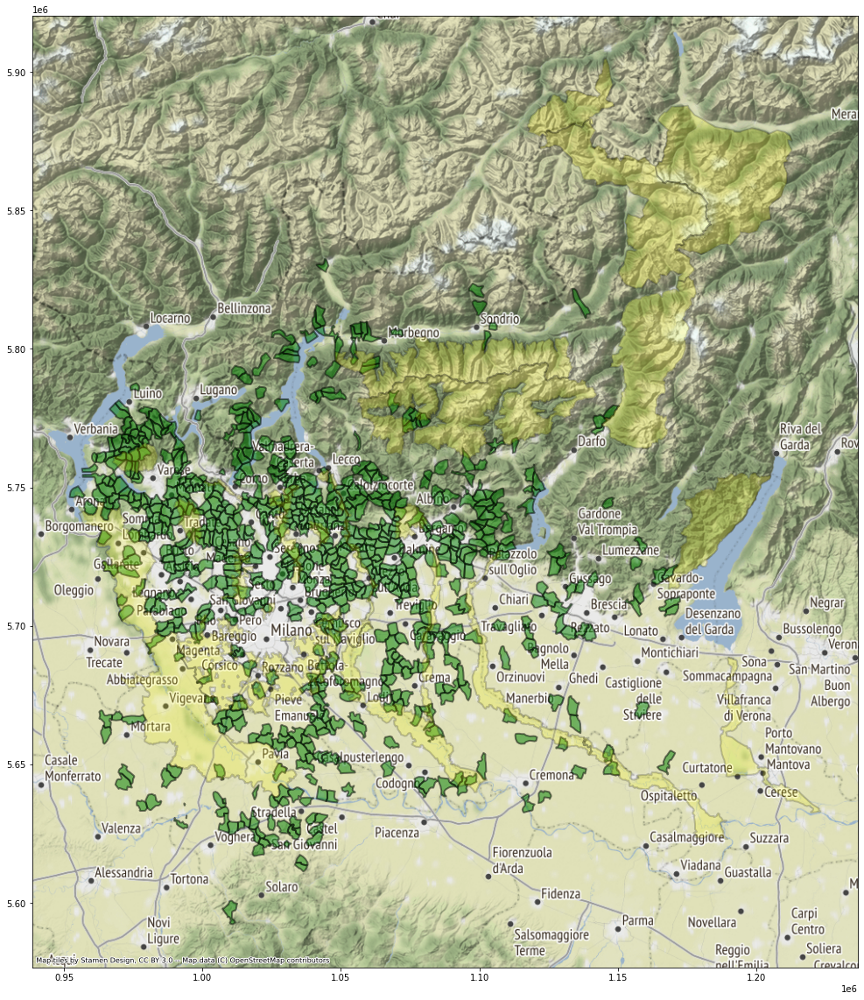

In [25]:
ax = comuni_min.to_crs(epsg = 3857).plot(facecolor = "green", edgecolor = "black", linewidth= 2, alpha = 0.5, figsize = (20,20))
parchi.to_crs(epsg = 3857).plot(ax = ax, facecolor = "yellow", edgecolor = "black", linewidth= 2, alpha = 0.2)
contextily.add_basemap(ax)

print("Il comuni sono: ", comuni_min.shape[0]) #stampo il numero dei comuni

comuni_min["COMUNE"]

3. l'elenco dei comuni che hanno un'area inferiore ai 10 kmq, che si trovano all'interno di un parco e sono attraversati da un corso d'acqua: visualizzare il numero, l'elenco e la mappa  con tutti i comuni colorati in verde (trasparente) e bordati di nero. Visualizzare anche i corsi d'acqua

In [27]:
corsi = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/geopandas-tutorial-master/data/Corsi_acqua_Piano_di_Gestione.zip")
corsi

,OBJECTID,COD_PTUA16,NATURA,REGIONE,NOME,SOTTOBACIN,TIPOLOGIA,A_PROTETTA,SENSIBILE,VULNERABIL,D_HABITAT,D_UCCELLI,RAMSAR,BALNEAZION,VITA_PESCI,USO_POTAB,AREE_A_PR,BACINO,RAGG_ECO,RAGG_CHI,STATO_ECO,CONF_ECO,STATO_CHI,CONF_CHI,ANNI_CHI,ANNI_ECO,OBB_CHI,OBB_ECO,ESENZIONI,SHAPE_LEN,geometry
0,188,IT03POTI3GRCA1LO,artificiale,Lombardia,Naviglio Grande (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,sufficiente,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,44301.215986,"LINESTRING (480362.262 5040575.220, 480364.627..."
1,191,IT03POTI3SNCA1LO,artificiale,Lombardia,Scolmatore Piene Nord - Ovest (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,34035.857991,"MULTILINESTRING ((494060.091 5029696.046, 4940..."
2,215,IT03N0080447LO,naturale,Lombardia,Lambro (Fiume),Lambro (Asta),06SS4N,sì,sì,sì,no,sì,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,21811.145089,"MULTILINESTRING ((536963.747 5005395.412, 5369..."
3,252,IT03N008044003021LO,naturale,Lombardia,Garbogera (Torrente),Lambro (Asta),06IN7N,sì,no,sì,sì,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,sì,sì,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,19767.119220,"LINESTRING (509280.513 5047845.024, 509281.795..."
4,255,IT03N0080440441LO,naturale,Lombardia,Sillaro Salerano,Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,13180.757122,"LINESTRING (528977.056 5024109.798, 528981.181..."
5,256,IT03N0080440701LO,naturale,Lombardia,Addetta (Colatore),Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,9403.459186,"MULTILINESTRING ((530299.337 5029522.740, 5302..."
6,282,IT03POLSRECA1LO,artificiale,Lombardia,Redefossi (Cavo),nd,06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,18403.681560,"LINESTRING (514894.561 5036362.164, 514898.993..."
7,65,ITIRN0080984IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,no,sì,TICINO,no,no,sufficiente,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,38206.257375,"MULTILINESTRING ((483579.882 5034726.498, 4835..."
8,66,ITIRN0080982IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,sì,sì,TICINO,no,no,buono,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,mantenimento dello stato buono,Nessuna proroga o deroga,35927.352062,"MULTILINESTRING ((477067.969 5044605.066, 4770..."
9,67,ITIRN0080983IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,no,sì,TICINO,no,no,buono,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,mantenimento dello stato buono,Nessuna proroga o deroga,17917.785813,"MULTILINESTRING ((477477.600 5043097.081, 4774..."


In [29]:
comuni_parco_fiume = comuni_min[comuni_min.within(parchi.geometry.squeeze().unary_union) & comuni_min.intersects(corsi.geometry.squeeze().unary_union)]
comuni_parco_fiume

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,Shape_Area_KM
1841,1,3,15,215,215,15061,015061,Cassinetta di Lugagnano,None,0,8392.126482,3.624219e+06,"POLYGON ((493127.901 5031226.632, 493816.897 5...",3.624219


Il comune è:  1


1841    Cassinetta di Lugagnano
Name: COMUNE, dtype: object

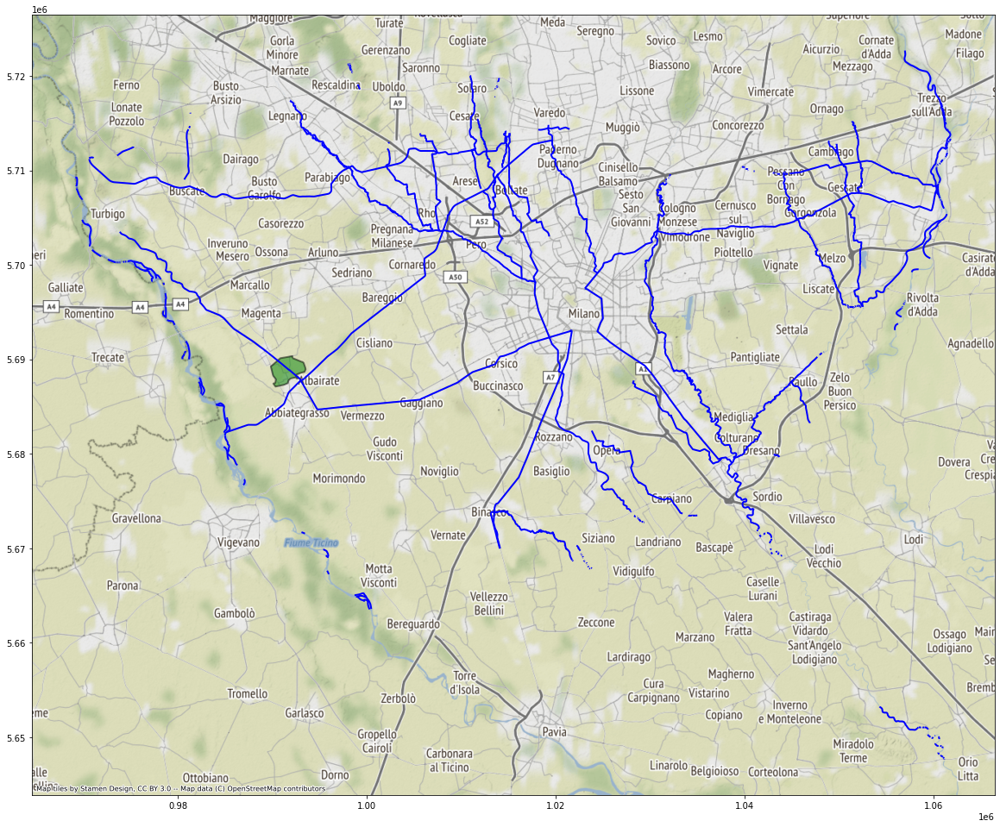

In [30]:
ax = comuni_parco_fiume.to_crs(epsg = 3857).plot(facecolor = "green", edgecolor = "black", linewidth= 2, alpha = 0.5, figsize = (20,20))
corsi.to_crs(epsg = 3857).plot(ax = ax, facecolor = "none", edgecolor = "blue", linewidth= 2)
contextily.add_basemap(ax)

print("Il comune è: ", comuni_parco_fiume.shape[0]) #stampo il numero dei comuni
comuni_parco_fiume["COMUNE"]

4. l'elenco dei comuni che si trovano a più di 1 km da un'autostrada: visualizzare il numero, l'elenco e una mappa con in rosso i comuni che si trovano a meno di 1 km e in verde gli altri (vedi immagine allegata)

In [32]:
autostrade = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/geopandas-tutorial-master/data/Autostrade_10000_CT10_line.zip")
autostrade

,TS_EID,COD_PE,PERCORSO,geometry
0,19.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (496352.634 4981573.415, 496378.384..."
1,18.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (580517.421 4994637.417, 580735.915..."
2,21.0,A21,AUTOSTRADA TORINO- PIACENZA- BRESCIA,"LINESTRING (580524.796 4994628.417, 580745.039..."
3,65.0,A50,TANGENZIALE OVEST DI MILANO,"LINESTRING (521699.514 5024872.823, 521630.139..."
4,62.0,A50,TANGENZIALE OVEST DI MILANO,"LINESTRING (504384.530 5044095.266, 504414.405..."
5,90.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (519364.775 5030574.241, 519401.151..."
6,78.0,A51,TANGENZIALE EST DI MILANO,"LINESTRING (519346.650 5030596.741, 519377.151..."
7,7.0,A1,AUTOSTRADA MILANO - ROMA,"LINESTRING (519364.775 5030574.241, 519352.525..."
8,8.0,A1,AUTOSTRADA MILANO - ROMA,"LINESTRING (519346.650 5030596.741, 519337.900..."
9,1922.0,A8,AUTOSTRADA MILANO- VARESE,"LINESTRING (485557.854 5069342.204, 485588.231..."


In [33]:
autostrade_squeeze = autostrade.geometry.squeeze()

In [34]:
autostrade_union = autostrade.unary_union

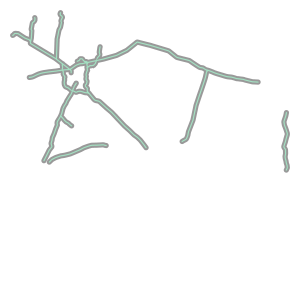

In [35]:
autostrade_buffer = autostrade_union.buffer(1000)
autostrade_buffer

In [39]:
comuni_nel_km = comuni[comuni.intersects(autostrade_buffer)]
comuni_nel_km

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,Shape_Area_KM
417,1,1,3,0,3,3043,003043,Castelletto sopra Ticino,None,0,18446.745417,1.493419e+07,"POLYGON ((469419.417 5063663.891, 469892.322 5...",14.934192
463,1,1,3,0,3,3131,003131,Romentino,None,0,22457.257833,1.796551e+07,"POLYGON ((483590.971 5036503.093, 483632.971 5...",17.965514
474,1,1,3,0,3,3149,003149,Trecate,None,0,33038.722421,3.790406e+07,"MULTIPOLYGON (((481416.863 5033276.118, 481435...",37.904060
1039,1,1,6,0,6,6053,006053,Castelnuovo Scrivia,None,0,35699.776621,4.526467e+07,"MULTIPOLYGON (((492219.908 4983817.488, 492722...",45.264674
1114,1,1,6,0,6,6132,006132,Pontecurone,None,0,21802.256235,2.992377e+07,"POLYGON ((496579.877 4981571.007, 496895.873 4...",29.923772
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7734,1,3,108,0,108,108044,108044,Usmate Velate,None,0,14276.627617,9.719044e+06,"POLYGON ((527095.650 5057351.438, 527786.020 5...",9.719044
7740,1,3,108,0,108,108050,108050,Vimercate,None,0,24791.429563,2.059253e+07,"POLYGON ((527733.646 5054237.461, 527716.646 5...",20.592528
7741,1,3,108,0,108,108051,108051,Busnago,None,0,11376.029586,5.834750e+06,"POLYGON ((535742.586 5052473.474, 535839.585 5...",5.834750
7742,1,3,108,0,108,108052,108052,Caponago,None,0,11874.711735,4.807794e+06,"POLYGON ((530927.622 5047008.514, 530890.358 5...",4.807794


In [38]:
comuni_lontani_1km = comuni_lombardia[~comuni_lombardia.intersects(autostrade_buffer)]
comuni_lontani_1km

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry,Shape_Area_KM
1448,1,3,12,0,12,12001,012001,Agra,None,0,6996.108320,2.942389e+06,"POLYGON ((482802.662 5097733.142, 482784.662 5...",2.942389
1450,1,3,12,0,12,12003,012003,Angera,None,0,24194.847570,1.748219e+07,"POLYGON ((470218.756 5071198.335, 470937.656 5...",17.482186
1451,1,3,12,0,12,12004,012004,Arcisate,None,0,19072.979574,1.229388e+07,"POLYGON ((488207.686 5080963.765, 488368.654 5...",12.293875
1454,1,3,12,0,12,12007,012007,Azzio,None,0,7602.953671,2.172798e+06,"POLYGON ((477914.331 5082436.678, 477696.259 5...",2.172798
1455,1,3,12,0,12,12008,012008,Barasso,None,0,10877.705348,3.872669e+06,"POLYGON ((481124.582 5079579.276, 481862.732 5...",3.872669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7737,1,3,108,0,108,108047,108047,Veduggio con Colzano,None,0,7986.758681,3.390555e+06,"POLYGON ((519686.705 5065270.380, 519754.706 5...",3.390555
7738,1,3,108,0,108,108048,108048,Verano Brianza,None,0,9171.724083,3.667862e+06,"POLYGON ((517613.394 5060787.396, 518293.122 5...",3.667862
7739,1,3,108,0,108,108049,108049,Villasanta,None,0,9629.121636,4.645122e+06,"POLYGON ((523356.646 5052024.704, 523490.961 5...",4.645122
7743,1,3,108,0,108,108053,108053,Cornate d'Adda,None,0,15414.910444,1.364665e+07,"POLYGON ((537678.573 5057235.438, 537951.570 5...",13.646650


I comuni a meno di 1km sono:  279


417     Castelletto sopra Ticino
463                    Romentino
474                      Trecate
1039         Castelnuovo Scrivia
1114                 Pontecurone
                  ...           
7734               Usmate Velate
7740                   Vimercate
7741                     Busnago
7742                    Caponago
7745                    Roncello
Name: COMUNE, Length: 279, dtype: object

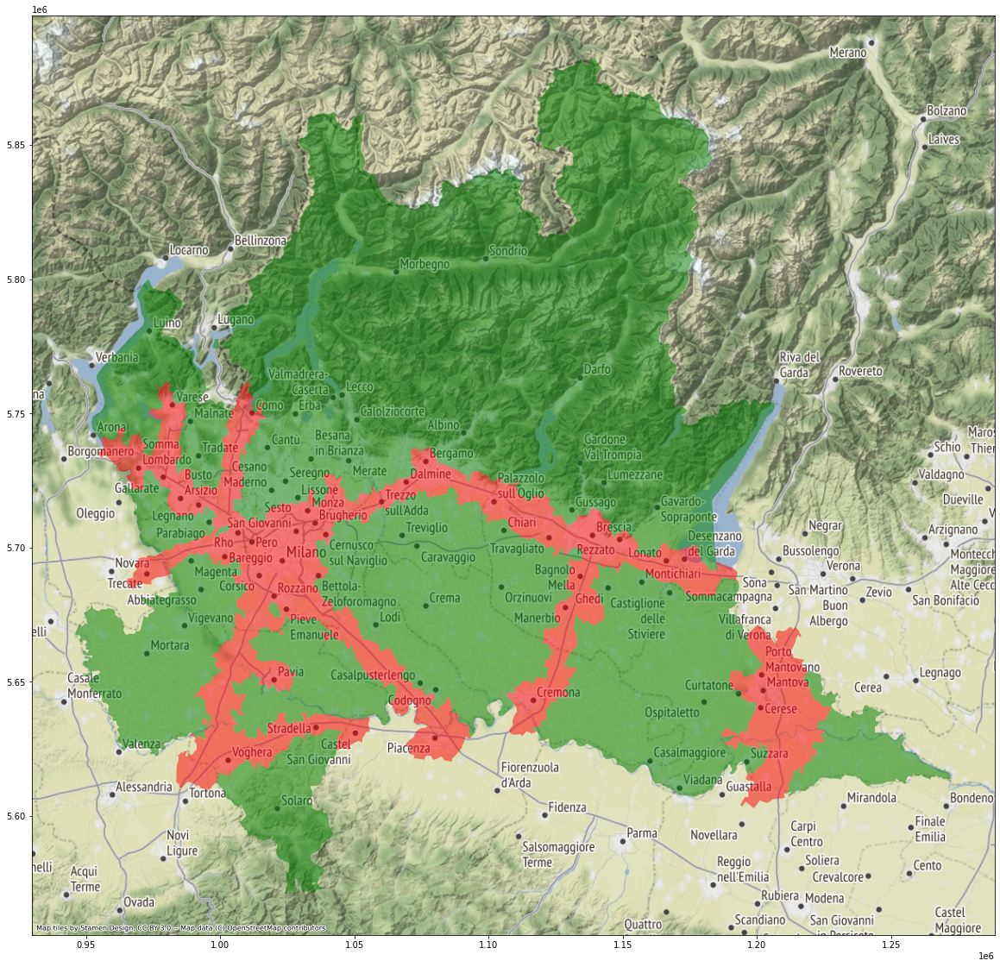

In [42]:
ax = autostrade_squeeze.to_crs(epsg = 3857).plot(facecolor = "none", edgecolor = "none",linewidth= 2, figsize = (20,20))
comuni_nel_km.to_crs(epsg = 3857).plot(ax = ax, facecolor = "red", edgecolor = "none", linewidth= 2, alpha = 0.5)
comuni_lontani_1km.to_crs(epsg = 3857).plot(ax = ax, facecolor = "green", edgecolor = "none", linewidth= 2, alpha = 0.5)
contextily.add_basemap(ax)

print("I comuni a meno di 1km sono: ", comuni_nel_km.shape[0]) #stampo il numero dei comuni

comuni_nel_km["COMUNE"]

5. l'elenco dei quartieri di Milano attraversati da una autostrada: visualizzare una mappa con i quartieri. Aggiungere anche il nome del quartiere sulla mappa.


In [44]:
quartieri_milano = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/geopandas-tutorial-master/data/ds964_nil_wm.zip")
quartieri_milano

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
0,48,RONCHETTO SUL NAVIGLIO - Q.RE LODOVICO IL MORO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8723.368714,2.406306e+06,89,"POLYGON ((9.15422 45.43775, 9.15419 45.43707, ..."
1,64,TRENNO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3309.998800,4.896921e+05,90,"POLYGON ((9.10623 45.49016, 9.10295 45.48939, ..."
2,67,PORTELLO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3800.750663,9.096022e+05,91,"POLYGON ((9.15636 45.48785, 9.15724 45.48721, ..."
3,81,BOVISASCA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7105.469715,1.578028e+06,92,"POLYGON ((9.16803 45.52234, 9.16687 45.52027, ..."
4,84,PARCO NORD,05/02/2020,Vigente,Milano 2030 - PGT Approvato,11741.717005,1.532331e+06,93,"POLYGON ((9.20040 45.52848, 9.20055 45.52828, ..."
...,...,...,...,...,...,...,...,...,...
83,68,PAGANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5221.836696,1.289686e+06,172,"POLYGON ((9.17174 45.47619, 9.17150 45.47595, ..."
84,2,BRERA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5461.667196,1.637333e+06,173,"POLYGON ((9.19165 45.46906, 9.19105 45.46843, ..."
85,33,ROGOREDO - SANTA GIULIA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6012.496435,1.200116e+06,174,"POLYGON ((9.24044 45.44427, 9.24084 45.44424, ..."
86,17,ADRIANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,9276.875747,2.433358e+06,175,"POLYGON ((9.26729 45.51234, 9.26701 45.51241, ..."


In [45]:
quartieri_attr = quartieri_milano[quartieri_milano.intersects(autostrade.to_crs(epsg = 4326).unary_union)]
quartieri_attr

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((9.08375 45.48485, 9.08280 45.48521, ..."
7,76,QUARTO OGGIARO - VIALBA - MUSOCCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7138.355680,2.776872e+06,96,"POLYGON ((9.13481 45.52095, 9.13481 45.52094, ..."
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((9.08375 45.48485, 9.08444 45.48459, ..."
16,43,TIBALDI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3964.077498,7.861846e+05,105,"POLYGON ((9.18775 45.43732, 9.18644 45.43733, ..."
22,75,STEPHENSON,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3582.570059,5.600844e+05,111,"POLYGON ((9.13009 45.50820, 9.13016 45.50784, ..."
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((9.16112 45.42589, 9.16270 45.42544, ..."
26,46,BARONA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6836.011433,2.006249e+06,115,"POLYGON ((9.16112 45.42589, 9.16056 45.42605, ..."
27,71,VILLAPIZZONE - CAGNOLA - BOLDINASCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8375.003494,3.426941e+06,116,"POLYGON ((9.16204 45.49690, 9.16012 45.49570, ..."
28,88,PARCO BOSCO IN CITTA',05/02/2020,Vigente,Milano 2030 - PGT Approvato,37072.981211,7.834006e+06,117,"POLYGON ((9.07309 45.50604, 9.07326 45.50589, ..."
31,32,TRIULZO SUPERIORE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6923.734083,1.389578e+06,120,"POLYGON ((9.26378 45.43251, 9.26384 45.43248, ..."


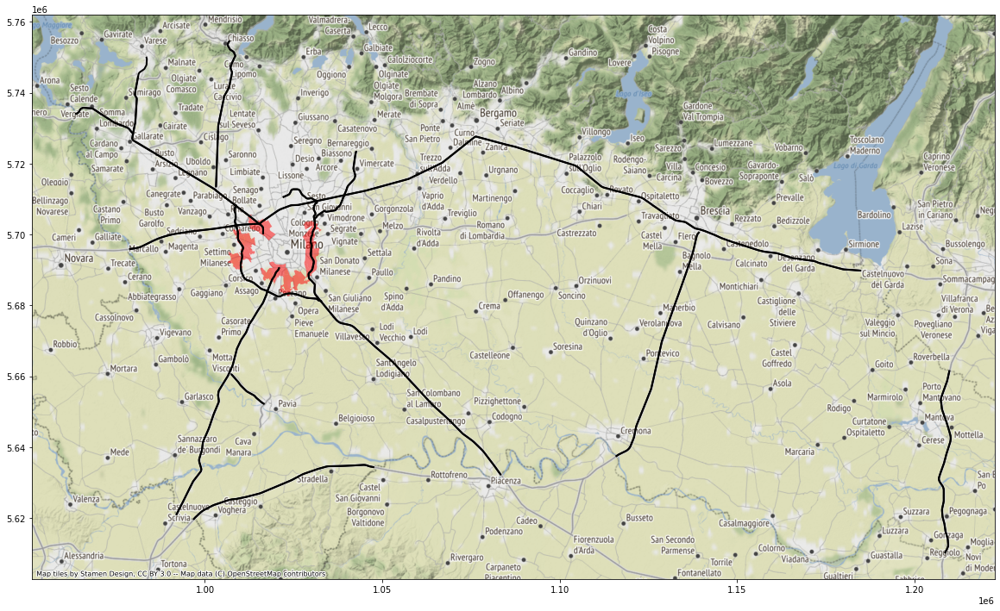

In [46]:
ax = autostrade_squeeze.to_crs(epsg = 3857).plot(facecolor = "none", edgecolor = "black", linewidth= 2, figsize = (20,20))
quartieri_attr.to_crs(epsg = 3857).plot(ax = ax, facecolor = "red", edgecolor = "none", linewidth= 2, alpha = 0.5)
contextily.add_basemap(ax)